# Titanic Data Analysis


## Steps:
   ### 1. Data Handling
   - Importing Data with Pandas 
   - Data Wrangling
   - Analysing Data through Visualizations     

   ### 2. Logistic Regression
   - Converting Data to a numerical format 
   - Building a model
   - Accuracy check
   - Predictions


In [32]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline

## 1. Collecting Data

In [33]:
titanic_dataset = pd.read_csv('Titanic-Dataset.csv')
titanic_dataset.head(10)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
5,6,0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,NaN,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,NaN,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,NaN,C


In [34]:
titanic_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


### Summary:
The Dataset contains 891 observations, or passengers to analyze:
- `RangeIndex: 891 entries, 0 to 890`

There are missing values in Dataset, i.e. `Age`, `Cabin`, `Embarked`:
- `Age          714 non-null    float64`
- `Cabin        204 non-null    object `
- `Embarked     889 non-null    object `


# Data Wrangling 

In [35]:
titanic_dataset.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

-> 177 missing values in `Age`, 687 missing values in `Cabin`, 2 missing values in `Embarked`

Text(0.5, 1.0, 'Missing Data')

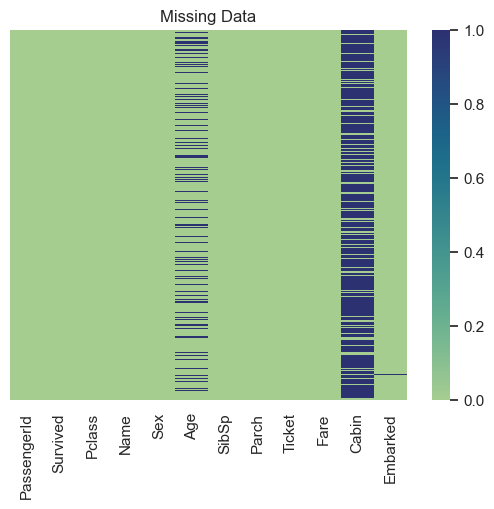

In [36]:
sns.heatmap(titanic_dataset.isnull(), yticklabels=False, cmap="crest").set_title('Missing Data')

## Taking care of missing values:
- the feature `Cabin` has many missing values and so can't add much value for analysis -> drop from dataset
- the feature `Ticket` does not provide any useful information for analysis -> drop fron dataset
- the features `Age` and `Embarked` have missing values -> remove observation from dataset if it only has 1 `NaN` in one of the features 

In [37]:
titanic_dataset.drop(["Cabin", "Ticket"], axis=1, inplace=True) 
titanic_dataset.dropna(inplace=True) 

<Axes: >

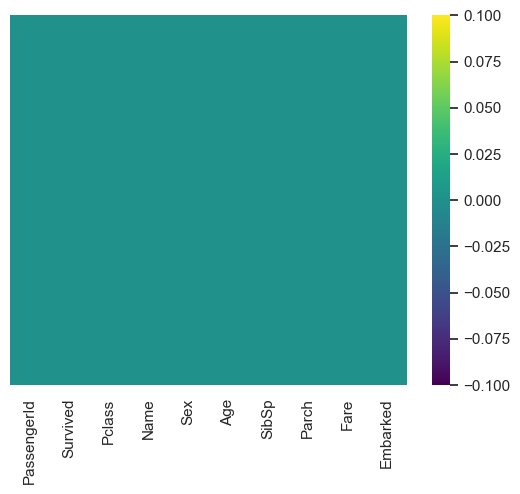

In [38]:
sns.heatmap(titanic_dataset.isnull(), yticklabels=False, cmap="viridis")

In [39]:
titanic_dataset.isnull().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Fare           0
Embarked       0
dtype: int64

In [40]:
titanic_dataset

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,8.0500,S
...,...,...,...,...,...,...,...,...,...,...
885,886,0,3,"Rice, Mrs. William (Margaret Norton)",female,39.0,0,5,29.1250,Q
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,13.0000,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,30.0000,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,30.0000,C


## Visualizations

In [41]:
sns.set_theme(style="whitegrid")

fig = plt.figure(figsize=(18, 6), dpi=1600)
alpha_scatterplot = 0.2
alpha_bar_chart = 0.55

ax1 = plt.subplot2grid((1, 2), (0, 0))
sns.countplot(x='Survived', data=titanic_dataset, alpha=alpha_bar_chart)
ax1.set_xlim(-1, 2)
plt.title("Distribution of Survival, (1 = Survived)")

plt.subplot2grid((1, 2), (0, 1))
sns.countplot(x="Survived", hue="Sex", data=titanic_dataset, alpha=alpha_bar_chart) 
plt.legend(('male', 'female'), loc='best')
plt.title("Survival by sex, (1 = Survived)")


Text(0.5, 1.0, 'Survival by sex, (1 = Survived)')

In [42]:
fig2 = plt.figure(figsize=(18, 6), dpi=1600)
sns.kdeplot(data=titanic_dataset, x='Age', hue='Pclass', fill=True, common_norm=False)
plt.xlabel("Age")
plt.title("Age Distribution within classes")
plt.legend(('3rd Class', '2nd Class', '1st Class'), loc='best')

In [43]:
fig3 = plt.figure(figsize=(18, 6), dpi=1600)
ax3 = plt.subplot2grid((1, 2), (0, 0))
sns.countplot(y='Pclass', data=titanic_dataset, alpha=alpha_bar_chart)
ax3.set_ylim(-1, len(titanic_dataset['Pclass'].value_counts()))
plt.title("Class Distribution")

plt.subplot2grid((1, 2), (0, 1))
sns.countplot(x="Survived", hue="Pclass", data=titanic_dataset, alpha=alpha_bar_chart)
plt.title("Survival by Class,  (1 = Survived)")
plt.legend(('1st Class', '2nd Class', '3rd Class'), loc='best')

In [44]:
fig4 = plt.figure(figsize=(18, 6), dpi=1600)
plt.subplot2grid((1, 2), (0, 0))
sns.histplot(titanic_dataset['Age'], alpha=alpha_bar_chart)
plt.title("Age Distribution")

plt.subplot2grid((1, 2), (0, 1))
sns.violinplot(x='Survived', y='Age', data=titanic_dataset, palette='Blues')
plt.title('Survival by Age')

Text(0.5, 1.0, 'Survival by Age')

In [45]:
fig5 = plt.figure(figsize=(18, 6), dpi=1600)
plt.subplot2grid((1, 3), (0, 0))
sns.histplot(titanic_dataset['Fare'], alpha=alpha_bar_chart, bins=20)
plt.title("Fare Distribution")

plt.subplot2grid((1, 3), (0, 1))
sns.countplot(x='SibSp', data=titanic_dataset, alpha=alpha_bar_chart)
plt.title('Siblings/Spouses')

plt.subplot2grid((1, 3), (0, 2))
sns.countplot(x='Parch', data=titanic_dataset, alpha=alpha_bar_chart)
plt.title('Parents/Children')

Text(0.5, 1.0, 'Parents/Children')

## 2. Logistic Regression

### Build & train

### Data should be converted to numeric format 

In [46]:
df = titanic_dataset[['Survived', 'Age', 'Sex', 'Pclass']]
df = pd.get_dummies(df, columns=['Sex', 'Pclass']).astype(int)

### Train & Test Data

The next step is to split the data into two datasets: one for training and one for testing

In [47]:
from sklearn.model_selection import train_test_split

x = df.drop('Survived', axis=1) # independent variables, features
y = df['Survived'] # target variable, what we want to predict, dependent variable
# x.columns = x.columns.astype(str)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, stratify=y, random_state=0)


In [48]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=0)
model.fit(x_train, y_train)

LogisticRegression(random_state=0)

Accuracy score(R-squared):

In [49]:
model.score(x_test, y_test)

0.8531468531468531

Cross Validation:

In [50]:
from sklearn.model_selection import cross_val_score

cross_val_score(model, x, y, cv=5).mean()

0.783689549886733

Confusion Matrix:

In [51]:
from sklearn.metrics import confusion_matrix

y_predicted = model.predict(x_test)
cm = confusion_matrix(y_test, y_predicted)

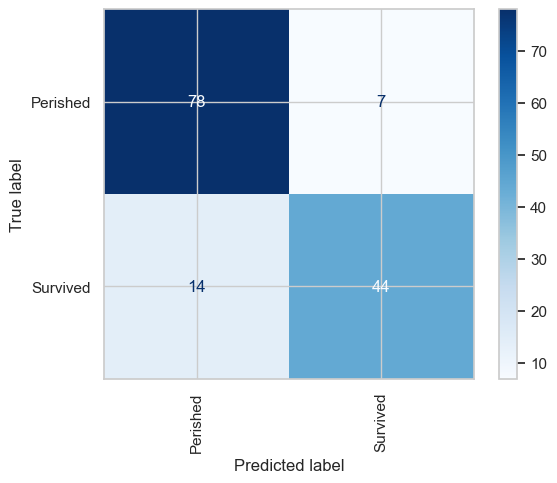

In [52]:
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Perished', 'Survived'])
disp.plot(cmap='Blues', values_format='d', xticks_rotation='vertical')

plt.show()

Classification report

In [53]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.85      0.92      0.88        85
           1       0.86      0.76      0.81        58

    accuracy                           0.85       143
   macro avg       0.86      0.84      0.84       143
weighted avg       0.85      0.85      0.85       143



Visualization of the model's accuracy by plotting an ROC curve.



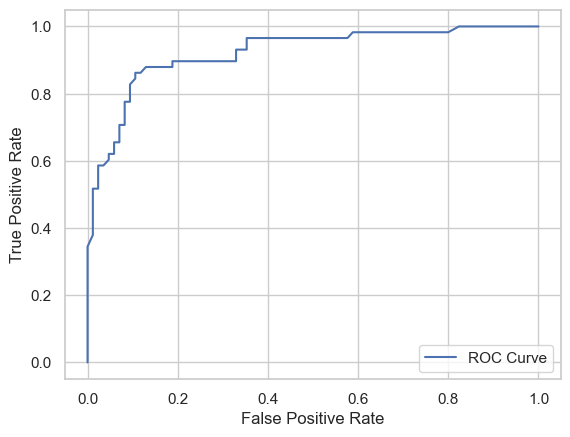

In [59]:
from sklearn.metrics import roc_curve, RocCurveDisplay

y_prob = model.predict_proba(x_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)

roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr)
roc_display.plot(label='ROC Curve')

plt.show()

## Predictions

Predict whether a 30-year-old female traveling in first class will survive the voyage

In [74]:
df.head(2)

,Survived,Age,Sex_female,Sex_male,Pclass_1,Pclass_2,Pclass_3
0,0,22,0,1,0,0,1
1,1,38,1,0,1,0,0


In [75]:
feature_names = x.columns

In [76]:
female = pd.DataFrame([[30, 1, 0, 1, 0, 0]], columns=feature_names)
prediction = model.predict(female)[0]

print(f'Prediction: {prediction}')

Prediction: 1


What is the probability that a 30-year-old female traveling in first class will survive?

In [77]:
probability = model.predict_proba(female)[0][1]
print(f'Probability of survival: {probability:.1%}')

Probability of survival: 90.5%


What is the probability that a 60-year-old male traveling in third class will survive?

In [78]:
male = pd.DataFrame([[60, 0, 1, 0, 0, 1]], columns=feature_names)
probability = model.predict_proba(male)[0][1]
print(f'Probability of survival: {probability:.1%}')

Probability of survival: 4.2%
